#### The U.S. Department of Transportation's (DOT) Bureau of Transportation Statistics tracks the on-time performance of domestic flights operated by large air carriers. Summary information on the number of on-time, delayed, canceled, and diverted flights is published in DOT's monthly Air Travel Consumer Report and in this dataset of 2015 flight delays and cancellations. We will mainly focus on the destination and source airport for the page (airport) rank. 

#### In this project, we are going to do data mining about the United states’ flight information. By exploring the flight information we can solve many doubts about the American airports. For instance, what are the most important airport in America? How to rank American airport? What are the best route between two locations? Besides, we also expect to visualize the United states airline network in various ways. Furthermore, since the dataset is about the flight delay, it is meaningful to explore the factors that influence the flight delay, there are many potential answers such as the flight distance, the influx and outflux of the airport. Being familiar with the reasons that cause flight delay helps customers to avoid such awkward situation. 

#### For this project we would use Page Rank as our primary method. We would use 322 airports listed in airports.csv as nodes and 5,819,079 fights as links to perform Page Rank in order to get the vector of importance for each airport. We could also use the longitude and latitude information for each airport to generate a 2 dimensional map of airports. We would include a mathematical algorithm to find distances between airports. Then, we would use Linear Regression to find relationship between each of the following data pairs: Airport importance and Flight delay rate, Distance between airports and Flight delay rate, Airline company and Flight delay rate. Based on my knowledge before any statistical implementation, I would expect airports with more transfer connection flights like LA International Airport, San Francisco International Airport, Denver International Airport, would have larger importance value. Airport importance would have a positive relation with Flight delay rate, Distance between airports would also have a positive relation with Flight delay rate, Airline company with higher ratings such as Delta would have a lower Flight delay rate and Airline company with lower ratings such as United Airline would have a higher Flight delay rate.



### Method used so far: PageRank, Hub & Authority, K-means

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
from scipy import stats
%config InlineBackend.figure_format = 'svg'

#### Read the file, get the arilines' name, airports and flights information from the csv file.

In [3]:
df_airlines = pd.read_csv('airlines.csv')
df_airports = pd.read_csv('airports.csv')
df = pd.read_csv('flights.csv')

/Users/ziyueguo/opt/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning: Columns (7,8) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


#### Show the number of the flights 

In [4]:
print( len(df) )

5819079


#### Store the original Airports as the keys of the dictionary, store the number of flights of each original airport as the key value 
#### Store the  Airporst destinations as the keys of the dictionary, store the number of flights that fly to this destination as the key value 

In [5]:
ori = df['ORIGIN_AIRPORT'].value_counts().to_dict()
des = df['DESTINATION_AIRPORT'].value_counts().to_dict()

#### After store the orignal airport dictionary and the destination airport dictionary, when we print the data we find the useless airports named by numbers, these airport maybe the minitary airport, but they are useless for us. Therefore the step below is to delete the meanless data from our dictionary.

#### Delete the meaningless data from destination airport 

In [6]:
airports = df_airports['IATA_CODE'].to_list()

data = []
for i in range(len(airports)):
    df_new = df[df['DESTINATION_AIRPORT'] == airports[i]]
    data.append(df_new)

In [7]:
result = pd.concat(data)

#### Delete the meaningless data from original airport 

In [8]:
data = []
for i in range(len(airports)):
    df_new = result[result['ORIGIN_AIRPORT'] == airports[i]]
    data.append(df_new)

In [9]:
final = pd.concat(data)

#### compare the numbers of flight before and after deleting the meaningless data

In [10]:
print (len(df))
print (len(result))
print (len(final))
print (len(df.columns))
print (df.columns)

5819079
5332914
5332914
31
Index(['YEAR', 'MONTH', 'DAY', 'DAY_OF_WEEK', 'AIRLINE', 'FLIGHT_NUMBER',
       'TAIL_NUMBER', 'ORIGIN_AIRPORT', 'DESTINATION_AIRPORT',
       'SCHEDULED_DEPARTURE', 'DEPARTURE_TIME', 'DEPARTURE_DELAY', 'TAXI_OUT',
       'WHEELS_OFF', 'SCHEDULED_TIME', 'ELAPSED_TIME', 'AIR_TIME', 'DISTANCE',
       'WHEELS_ON', 'TAXI_IN', 'SCHEDULED_ARRIVAL', 'ARRIVAL_TIME',
       'ARRIVAL_DELAY', 'DIVERTED', 'CANCELLED', 'CANCELLATION_REASON',
       'AIR_SYSTEM_DELAY', 'SECURITY_DELAY', 'AIRLINE_DELAY',
       'LATE_AIRCRAFT_DELAY', 'WEATHER_DELAY'],
      dtype='object')


In [11]:
df_useful = pd.concat([df['AIRLINE'], df['ORIGIN_AIRPORT'], df['DESTINATION_AIRPORT'], df['DISTANCE'], df['ARRIVAL_DELAY'], df['CANCELLED']], axis = 1)
df_useful.head(20)

,AIRLINE,ORIGIN_AIRPORT,DESTINATION_AIRPORT,DISTANCE,ARRIVAL_DELAY,CANCELLED
0,AS,ANC,SEA,1448,-22.0,0
1,AA,LAX,PBI,2330,-9.0,0
2,US,SFO,CLT,2296,5.0,0
3,AA,LAX,MIA,2342,-9.0,0
4,AS,SEA,ANC,1448,-21.0,0
5,DL,SFO,MSP,1589,8.0,0
6,NK,LAS,MSP,1299,-17.0,0
7,US,LAX,CLT,2125,-10.0,0
8,AA,SFO,DFW,1464,-13.0,0
9,DL,LAS,ATL,1747,-15.0,0


#### Get the new dictionary

In [12]:
ori = final['ORIGIN_AIRPORT'].value_counts().to_dict()
des = final['DESTINATION_AIRPORT'].value_counts().to_dict()

### PageRank
#### Establish the adjacent matrix of airports 

In [13]:
m = np.zeros([len(airports), len(airports)])

num = len(airports)
for i in range(num):
    for j in range(num):
        o = airports[i]
        d = airports[j]
        df_ori = data[i]
        m[j][i] = len(df_ori[df_ori['DESTINATION_AIRPORT'] == d]) / ori[o]

In [14]:
r = np.ones(num) / num
#r = r.reshape(-1,1)
#r0 = r * 0
r0 = np.zeros(num)

while not np.all(r0 == r):
    r0 = r
    r = np.dot(m, r)
    
#print (r)

In [15]:
print (airports[0],r[0])
print (airports[10],r[10])
print (airports[20],r[20])
print (airports[30],r[30])
print (airports[40],r[40])
print (airports[50],r[50])
print (airports[60],r[60])

ABE 0.000426718238237975
ADQ 8.623522399571248e-05
ATL 0.06505389719364002
BGR 6.894835407011919e-05
BPT 0.0001824694314236999
BUR 0.003541962119184691
CHS 0.00221650097122263


#### Compare the origin density, destination density, and pageRank of airports

In [16]:
j = len(airports) -1
r_sorted = np.sort(r)
print ('     Ori_Density Des_Density PageRank')
for i in ori.keys():
    print ('{:4s} {:9.9f} {:9.9f} {:9.9f}'.format(i, ori[i]/len(final), des[i]/len(final), r_sorted[j]))
    j = j-1
    if j < 310:
        break

     Ori_Density Des_Density PageRank
ATL  0.065036864 0.065049615 0.065053897
ORD  0.053607465 0.053611590 0.053612750
DFW  0.044919344 0.044925157 0.044923674
DEN  0.036763203 0.036754765 0.036753724
LAX  0.036504058 0.036508370 0.036506243
SFO  0.027753682 0.027745807 0.027744547
PHX  0.027529977 0.027529415 0.027528862
IAH  0.027493787 0.027505225 0.027505282
LAS  0.024973401 0.024976589 0.024975433
MSP  0.021023590 0.021025653 0.021025704
MCO  0.020810761 0.020810386 0.020810701
SEA  0.020795198 0.020796698 0.020796021


#### Visualize the pageRank of airports according to the coordinates of airports

Text(0, 0.5, 'latitude')

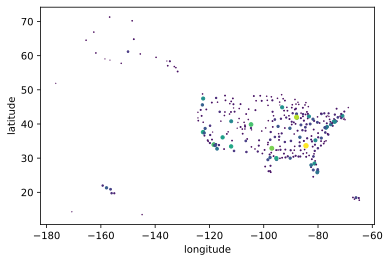

In [17]:
lat = df_airports['LATITUDE'].to_numpy()
lon = df_airports['LONGITUDE'].to_numpy()
size = []
for i in range(len(airports)):
    size.append((ori[airports[i]] / len(final))**0.6 * 100)

plt.scatter(lon, lat, s = size, c = size)
plt.xlabel('longitude')
plt.ylabel('latitude')

#### Visualize the pageRank of airports according to the coordinates of airports between N20 ~ 54 latitude and W65 ~ 130 longitude (e.g. ignore the airports in Alaska due to the distortion of projection at high latitude)

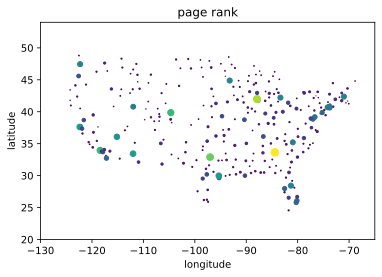

In [18]:
lat = df_airports['LATITUDE'].to_numpy()
lon = df_airports['LONGITUDE'].to_numpy()
size = []
for i in range(len(airports)):
    size.append((ori[airports[i]] / len(final))**0.7 * 400)

plt.scatter(lon, lat, s = size, c = size)
plt.xlabel('longitude')
plt.ylabel('latitude')
plt.xlim([-130, -65])
plt.ylim([20, 54])
plt.title('page rank')
plt.savefig('pagerank.pdf')

#### Hub and Authority 

In [19]:
M = np.zeros([len(airports), len(airports)])

for i in range(len(airports)):
    for j in range(len(airports)):
        d = airports[j]
        df_ori = data[i]
        if len(df_ori[df_ori['DESTINATION_AIRPORT'] == d]) > 0:
            M[i][j] = 1

#### Compare the authority score with page rank

In [20]:
Mt = M.transpose()
a = np.ones(len(airports))
h = np.ones(len(airports))
a0 = np.zeros(len(airports))
h0 = np.zeros(len(airports))
#while not np.all(a0 == a):
#i = 0

def dist_L1(x,y):
    return np.sum(np.abs(np.array(x)-np.array(y)))

tol = 1e-8

while dist_L1(a0, a) > tol:
    a0 = a
    h0 = h
    a = np.dot(Mt, h)
    a = a/np.max(a)
    h = np.dot(M, a)
    h = h/np.max(h)
    i += 1

#print ('Authorities :', a)
#print ('hubs :', h)

for i in range (10):
    print (a[i], r[i])

0.06714767634748571 0.000426718238237975
0.019416659909908242 0.00043638886631341175
0.35177263927648383 0.003598048498748936
0.01817271062356536 0.00012583504218673908
0.021396163028882496 0.00016430593693165835
0.04179953514282103 9.225392769896397e-05
0.019416659909908242 0.00030211536898620817
0.014593769003289644 0.0002472505406701113
0.1378255513767021 0.0006695480116860933
0.005521834458649017 1.799691631214869e-05


#### make the plot of authority score

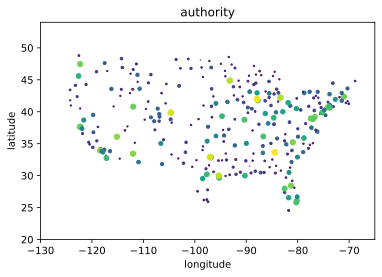

In [21]:
lat = df_airports['LATITUDE'].to_numpy()
lon = df_airports['LONGITUDE'].to_numpy()
size = []
for i in range(len(airports)):
    size.append(a[i]**0.7 * 35)

plt.scatter(lon, lat, s = size, c = size)
plt.xlabel('longitude')
plt.ylabel('latitude')
plt.xlim([-130, -65])
plt.ylim([20, 54])
plt.title('authority')
plt.savefig('authority.pdf')

#### The hub and authority are almost same, since we are using a undericted (almost) graph.

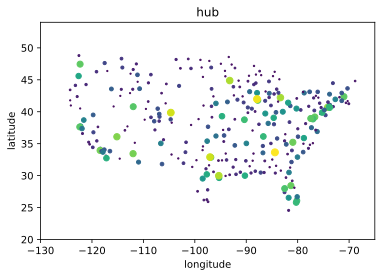

In [22]:
lat = df_airports['LATITUDE'].to_numpy()
lon = df_airports['LONGITUDE'].to_numpy()
size = []
for i in range(len(airports)):
    size.append(h[i]**0.8 * 50)

plt.scatter(lon, lat, s = size, c = size)
plt.xlabel('longitude')
plt.ylabel('latitude')
plt.xlim([-130, -65])
plt.ylim([20, 54])
plt.title('hub')
plt.savefig('hub.pdf')

#### short head and long tail

Text(0, 0.5, 'PageRank')

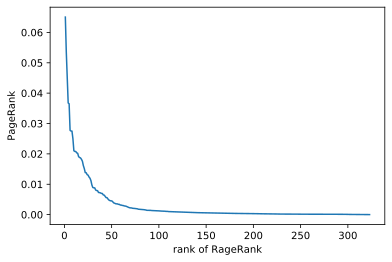

In [23]:
r_sorted_d = sorted(r_sorted, reverse=True)
x = np.linspace(1, num + 1, num)
plt.plot(x, r_sorted_d)
plt.xlabel('rank of RageRank')
plt.ylabel('PageRank')

#### the box plot is not very beautiful, and difficult to see the Q1, mean, Q3 of pagerank data

PR mean: 0.003105590062111801
PR min:  6.5569552164192206e-06 Airport: ATL
PR max:  0.06505389719364002 Airport: ITH


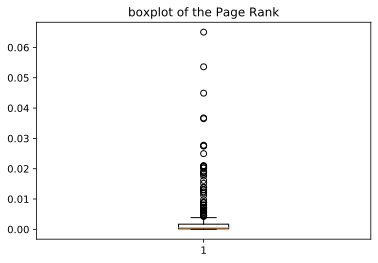

In [24]:
plt.boxplot(r)
plt.title('boxplot of the Page Rank')
print('PR mean:', r.mean())
print('PR min: ', r.min(), 'Airport: ATL')
print('PR max: ', r.max(), 'Airport: ITH')

#### So we take the log of PageRank, the result is relatively linear

Text(0, 0.5, 'log (PageRank)')

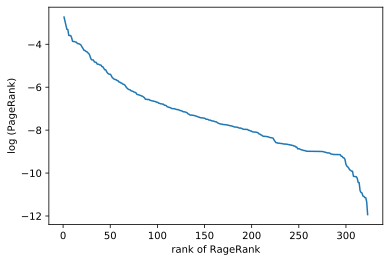

In [25]:
plt.plot(x, np.log(r_sorted_d))
plt.xlabel('rank of RageRank')
plt.ylabel('log (PageRank)')

{'whiskers': [<matplotlib.lines.Line2D at 0x1a454e24d0>,
 'caps': [<matplotlib.lines.Line2D at 0x1a30f84210>,
 'boxes': [<matplotlib.lines.Line2D at 0x1a454e2550>],
 'medians': [<matplotlib.lines.Line2D at 0x1a454e01d0>],
 'fliers': [<matplotlib.lines.Line2D at 0x1a46283490>],
 'means': []}

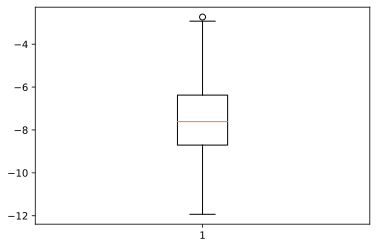

In [26]:
plt.boxplot(np.log(r))

From the Page Rank we have a rank of importance of all US airports base on the flight information of all fight inside the United States form 2015-1-1 to 2015-12-31. This is a rank base on near 6 million lines of fight data use the matrix multiplication page rank method taught on the advanced data science class. I would say this is a very reliable rank that could be referenced by future researchers. Also this rank would provide a guide to many other industries. For example, when the United States decided to build new airports, train stations or highways, this rank would provide the names and locations that needed the most. For an improper but very interesting assumption which is not going to happen, if Kim Jong-un want to nuke the United States, this result would tell him which city is most worthy. Lol.

Also we visualized the page rank results. We differentiate the importance of airports by different colors and sizes and locate them using the actual latitude and longitude information of airports. We nicely but not surprisingly find that the dots outlined a United States map. This would give people without professional data science knowledge a quick understanding of our result. This visualization could also be improvised and put onto our poster.

By far we could answer the question from the project proposal: What are the most import airports inside the United States? The rank is: ATL, ORD, DFW, DEN, LAX, SFO (From most important to the 6th important)

There are a lot columns of data are not used yet, for example the delay of each individual fights, times each fights take, fight companies, delay or cancelation reason, etc. We would further explore these data and apply more data science methods. One analysis method come in mind is K-means. By doing K-means we could find the most critical dependent to delays.

In [27]:
columns = df.columns
print (columns)
print(len(columns))

Index(['YEAR', 'MONTH', 'DAY', 'DAY_OF_WEEK', 'AIRLINE', 'FLIGHT_NUMBER',
       'TAIL_NUMBER', 'ORIGIN_AIRPORT', 'DESTINATION_AIRPORT',
       'SCHEDULED_DEPARTURE', 'DEPARTURE_TIME', 'DEPARTURE_DELAY', 'TAXI_OUT',
       'WHEELS_OFF', 'SCHEDULED_TIME', 'ELAPSED_TIME', 'AIR_TIME', 'DISTANCE',
       'WHEELS_ON', 'TAXI_IN', 'SCHEDULED_ARRIVAL', 'ARRIVAL_TIME',
       'ARRIVAL_DELAY', 'DIVERTED', 'CANCELLED', 'CANCELLATION_REASON',
       'AIR_SYSTEM_DELAY', 'SECURITY_DELAY', 'AIRLINE_DELAY',
       'LATE_AIRCRAFT_DELAY', 'WEATHER_DELAY'],
      dtype='object')
31


In [28]:
df_delay = final[final['AIR_SYSTEM_DELAY'] > 0]

In [29]:
delay_ori_count = df_delay['ORIGIN_AIRPORT'].value_counts().to_dict()
delay_des_count = df_delay['DESTINATION_AIRPORT'].value_counts().to_dict()

In [30]:
j = 0
for i in delay_ori_count.keys():
    print (i, delay_ori_count[i], ori[i])
    j += 1
    if j > 10:
        break

ORD 35778 285884
ATL 26397 346836
DFW 24684 239551
DEN 22720 196055
LAX 20904 194673
IAH 16416 146622
BOS 14209 107847
LGA 13882 99605
PHX 13626 146815
SFO 13551 148008
LAS 13150 133181


#### delay ratio of each airport

In [31]:
#j = 0
delay_ratio = {}
for i in delay_des_count.keys():
    delay_ratio[i] = delay_des_count[i] / des[i]
#    print (i, delay_des_count[i], des[i], delay_des_count[i] / des[i])
#    j += 1
#    if j > 10:
#        break

#### try to find the relationship between delay time and distance of airline, bt using sklearn.linear_model.LinearRegression
#### the pearsonr correlation is only 0.012, and the slope is extremly low, only 0.0007752. 
#### There is no relation between delay time and distance

In [35]:
dist = df_delay['DISTANCE'].to_numpy()
airline_delay = df_delay['AIRLINE_DELAY'].to_numpy()
num = len(dist)
print (num)
l = np.linspace(0, 53000, 53001).astype(int)
from sklearn.linear_model import LinearRegression
#lr = LinearRegression().fit(dist[l].reshape((-1,1)), airline_delay[l])
lr = LinearRegression().fit(dist.reshape((-1,1)), airline_delay)
pearsonr = stats.pearsonr(dist,airline_delay)
print(lr.coef_, lr.intercept_, pearsonr[0], pearsonr[1])
plt.scatter(dist[l], airline_delay[l])
plt.xlabel('distance')
plt.ylabel('delay time')

532628
[0.0007752] 11.204827494043762 0.012603774234795312 3.621359529405014e-20


Text(0, 0.5, 'delay time')

In [36]:
print (5000 * 0.0007752)

3.876


#### try to find the relation between delay ratio and distance

4983


<BarContainer object of 4984 artists>

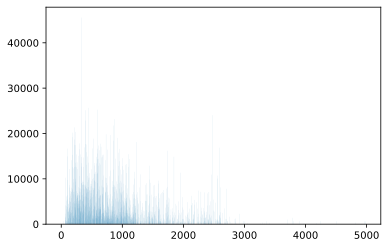

In [37]:
df_dist = final['DISTANCE'].value_counts().to_dict()
#print (df_dist)
dist = np.zeros(4984)
dist_ = np.linspace(0, 4983, 4984)
#print (dist_)
print (max(list(df_dist.keys())))
for i in df_dist.keys():
    dist[i] = df_dist[i]
plt.bar(dist_, dist)

#### generate a distance scale according to the bar plot above.

In [38]:
print (type(final))
dist_scale = np.array([0, 199, 299, 399, 499, 599, 699, 799, 899, 999, 1099, 1199, 1399, 1599, 1799, 1999, 2199, 2399, 2699, 3099, 3499, 3999, 5000])

<class 'pandas.core.frame.DataFrame'>


#### find the delay rate by calculate the number of delay flights and num of total

In [39]:
dist_rate = []
dist = []
for i in range(len(dist_scale) - 1):
    df_d = final[final['DISTANCE'] > dist_scale[i]]
    df_d = df_d[df_d['DISTANCE'] <= dist_scale[i+1]]
    nd = len(df_d)
    df_dd = df_delay[df_delay['DISTANCE'] > dist_scale[i]]
    df_dd = df_dd[df_dd['DISTANCE'] <= dist_scale[i+1]]
    ndd = len(df_dd)
    rate = ndd / nd
    dist_rate.append(rate)
    dist.append((dist_scale[i] + dist_scale[i+1]) / 2)

#### From the plot below, there is no relation between the delay ratio and distance

Text(0, 0.5, 'delay rate')

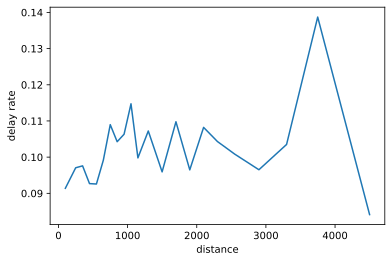

In [40]:
plt.plot(dist, dist_rate)
plt.xlabel('distance')
plt.ylabel('delay rate')

### K-means clustering: delay rate and page rank
#### normalize the delay rate by multiply by 5, this normalization make the delay rate contribute similar distance as the page rank in clustering
#### when k = 3, the three clusters represent: high page rank, lower page rank with high delay rate, lower page rank with low delay rate
#### using sklearn.cluster.KMeans to generate the clustering array

Text(0, 0.5, 'delay rate')

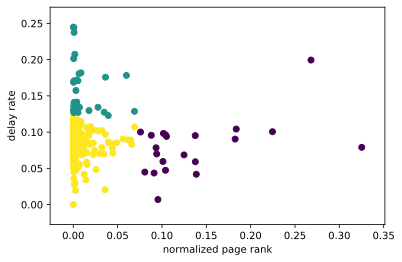

In [41]:
dr = []
for i in ori.keys():
    try:
        dr.append(delay_ratio[i])
    except:
        dr.append(0)
nr = np.array(r) * 5
dr = np.array(dr)
dr = dr

from sklearn.cluster import KMeans
data = np.array([nr, dr]).transpose()
k = 3
kmeans = KMeans(n_clusters = k, random_state = 1).fit_predict(data)

plt.scatter(nr, dr, c = kmeans)
plt.xlabel('normalized page rank')
plt.ylabel('delay rate')

#### a plot shows the clustering on map

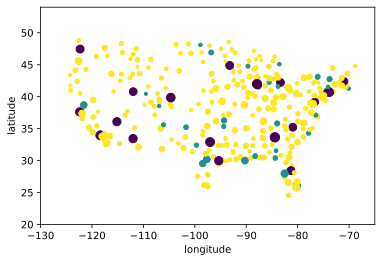

In [42]:
lat = df_airports['LATITUDE'].to_numpy()
lon = df_airports['LONGITUDE'].to_numpy()
size = []
for i in range(len(airports)):
    size.append((ori[airports[i]] / len(final))**0.3 * 200)

plt.scatter(lon, lat, s = size, c = kmeans)
plt.xlabel('longitude')
plt.ylabel('latitude')
plt.xlim([-130, -65])
plt.ylim([20, 54])

plt.savefig('hahahaha.pdf')

### Kmeans: Average arrival delay time vs page rank
#### k = 4, exist low page rank airport with extremly high average delay time

In [43]:
ori_keys = list(ori.keys())
adt = np.zeros(len(ori_keys))
adt_dict = {}

for i in range(len(ori_keys)):
    df_da = df_delay[df_delay['ORIGIN_AIRPORT'] == ori_keys[i]]
    delay_time = df_da['ARRIVAL_DELAY'].sum()
    adt[i] = delay_time / ori[ori_keys[i]]
    adt_dict[ori_keys[i]] = delay_time / ori[ori_keys[i]]

Text(0, 0.5, 'average delay time')

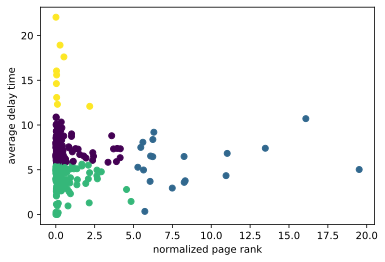

In [44]:
nr2 = np.array(r) * 300

data2 = np.array([nr2, adt]).transpose()
k = 4
kmeans2 = KMeans(n_clusters = k, random_state = 1).fit_predict(data2)

plt.scatter(nr2, adt, c = kmeans2)
plt.xlabel('normalized page rank')
plt.ylabel('average delay time')

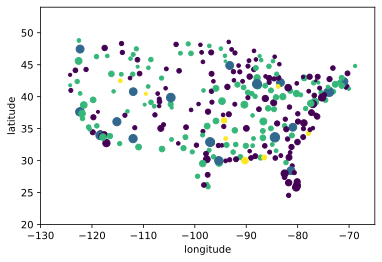

In [45]:
lat = df_airports['LATITUDE'].to_numpy()
lon = df_airports['LONGITUDE'].to_numpy()
size = []
for i in range(len(airports)):
    size.append((ori[airports[i]] / len(final))**0.3 * 200)

plt.scatter(lon, lat, s = size, c = kmeans2)
plt.xlabel('longitude')
plt.ylabel('latitude')
plt.xlim([-130, -65])
plt.ylim([20, 54])

plt.savefig('hahahaha.pdf')

#### airline and delay

Text(0, 0.5, 'delay rate')

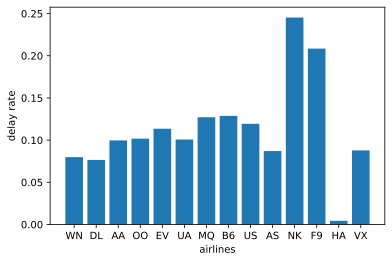

In [46]:
airline_dict = final['AIRLINE'].value_counts().to_dict()
airline_delay = df_delay['AIRLINE'].value_counts().to_dict()
airline_dr = {}
for i in airline_dict.keys():
    airline_dr[i] = airline_delay[i] / airline_dict[i]
    
#print (airline_dr)

plt.bar(range(len(airline_dr)), list(airline_dr.values()), align='center')
plt.xticks(range(len(airline_dr)), list(airline_dr.keys()))
plt.xlabel('airlines')
plt.ylabel('delay rate')

In [47]:
df_airlines

,IATA_CODE,AIRLINE
0,UA,United Air Lines Inc.
1,AA,American Airlines Inc.
2,US,US Airways Inc.
3,F9,Frontier Airlines Inc.
4,B6,JetBlue Airways
5,OO,Skywest Airlines Inc.
6,AS,Alaska Airlines Inc.
7,NK,Spirit Air Lines
8,WN,Southwest Airlines Co.
9,DL,Delta Air Lines Inc.


#### average delay time of each airline

Text(0, 0.5, 'average delay time')

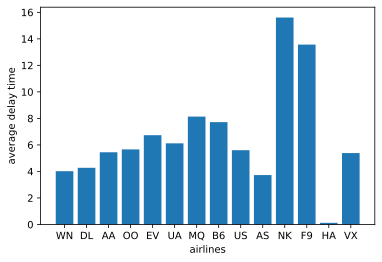

In [48]:
airline_delay_time = {}
for i in airline_dict.keys():
    df_ald = df_delay[df_delay['AIRLINE'] == i] 
    delay_time = (df_ald['ARRIVAL_DELAY'].sum()) / airline_dict[i]
    airline_delay_time[i] = delay_time
    
plt.bar(range(len(airline_delay_time)), list(airline_delay_time.values()), align='center')
plt.xticks(range(len(airline_delay_time)), list(airline_delay_time.keys()))
plt.xlabel('airlines')
plt.ylabel('average delay time')

#### airline and cancelation

Text(0, 0.5, 'cancel rate')

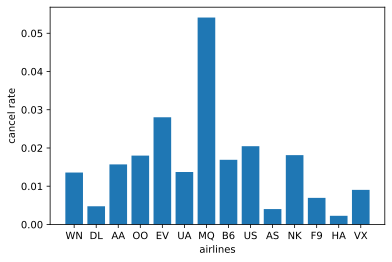

In [49]:
df_can = final[final['CANCELLED'] == 1]
airline_can = df_can['AIRLINE'].value_counts().to_dict()
airline_c = {}
for i in airline_dict.keys():
    airline_c[i] = airline_can[i] / airline_dict[i]
    
plt.bar(range(len(airline_c)), list(airline_c.values()), align='center')
plt.xticks(range(len(airline_c)), list(airline_c.keys()))
plt.xlabel('airlines')
plt.ylabel('cancel rate')